In [1]:
using FurutaPendulums
using AlphaZero
using Plots

In [50]:
ϕdotmax = 20.
# nϕdot = 1000
nϕdot = 100
θdotmax = 50.
nθdot = 100
# nθdot = 1000
nθ = 90
nu = 3
umax = 1.

function discrete_state(x)
    ϕ, ϕdot, θ, θdot = x
    ϕdot = clamp(ϕdot, -ϕdotmax, ϕdotmax)
    θdot = clamp(θdot, -θdotmax, θdotmax)
    i1 = round(Int,(ϕdotmax+ϕdot)/ϕdotmax/2*nϕdot)
    i2 = round(Int,(θ+pi)/pi/2*nθ)
    i3 = round(Int,(θdotmax+θdot)/θdotmax/2*nθdot)
    ϕdot = i1/nϕdot*2*ϕdotmax-ϕdotmax
    θ = i2/nθ*2pi-pi
    θdot = i3/nθdot*2*θdotmax-θdotmax
    return [0.,ϕdot,θ,θdot]
end
function state2int(x)
    ϕ, ϕdot, θ, θdot = x
    ϕdot = clamp(ϕdot, -ϕdotmax, ϕdotmax)
    θdot = clamp(θdot, -θdotmax, θdotmax)
    i1 = round(Int,(ϕdotmax+ϕdot)/ϕdotmax/2*nϕdot)
    i2 = round(Int,(θ+pi)/pi/2*nθ)
    i3 = round(Int,(θdotmax+θdot)/θdotmax/2*nθdot)
    return i1+ i2*nϕdot + i3*nϕdot*nθ
end
function int2state(n)
    i3 = n ÷ (nϕdot*nθ)
    i2 = (n-i3*nϕdot*nθ) ÷ nϕdot
    i1 = n-i2*nϕdot-i3*nϕdot*nθ
    ϕdot = i1/nϕdot*2*ϕdotmax-ϕdotmax
    θ = i2/nθ*2pi-pi
    θdot = i3/nθdot*2*θdotmax-θdotmax
    return [0.,ϕdot,θ,θdot]
end

n = state2int([0,-4,-pi+0.001,-4])
int2state(n)
discrete_state([0,-40,pi-0.255,-40])

4-element Vector{Float64}:
   0.0
 -20.0
   2.8832839242946324
 -40.0

In [51]:
struct GameSpec <: GI.AbstractGameSpec
    dt
end

GameSpec() = GameSpec(0.02)

mutable struct PendulumEnv <: GI.AbstractGameEnv
    furuta::SimulatedFurutaPendulum
    state
    t
end

function GI.init(::GameSpec)
    furuta = SimulatedFurutaPendulum()
    state = discrete_state([0.,0.,pi,0.])
    PendulumEnv(furuta,state,0.)
end

GI.spec(::PendulumEnv) = GameSpec()
GI.two_players(::GameSpec) = false
GI.white_playing(::PendulumEnv) = true
GI.actions(::GameSpec) = collect(-umax:2umax/(nu-1):umax)
GI.vectorize_state(::GameSpec,state) = Float32.(state)
GI.current_state(p::PendulumEnv) = p.state
GI.actions_mask(p::PendulumEnv) = ones(Bool,length(GI.actions(GI.spec(p))))*~GI.game_terminated(p)

function GI.game_terminated(p::PendulumEnv)
    # ϕ, ϕdot, θ, θdot = p.state
    # return abs(ϕdot)<0.1 && abs(θ)<0.1 && abs(θ)<0.1
    p.t > 5.
end

function GI.white_reward(p::PendulumEnv)
    ϕ, ϕdot, θ, θdot = p.state
    costs = abs(0.0018522 - 0.0018522 * cos(θ) - 0.00000387 * θdot^2 + 0.0000652*ϕdot^2*(cos(θ)<0.8))/0.0018522
    return -costs
end
function GI.set_state!(g::PendulumEnv, state)
  g.state = state
end

function GI.play!(g::PendulumEnv, u)
    g.furuta.x[2:4] = g.state[2:4]
    control(g.furuta,u)
    dt = GI.spec(g).dt
    periodic_wait(g.furuta,0.,dt)
    g.t += dt
    g.state = discrete_state(g.furuta.x)
end
GI.heuristic_value(::PendulumEnv) = 0.

penv = GI.init(GameSpec())
@show GI.play!(penv,0.)
@show GI.white_playing(penv)
@show GI.white_reward(penv)
@show GI.game_terminated(penv)
@show GI.actions(GI.spec(penv))
@show GI.current_state(penv)
@show GI.actions_mask(penv)

for i=1:250
    GI.play!(penv,0.)
end
@show GI.game_terminated(penv)
@show penv.t
;

GI.play!(penv, 0.0) = [0.0, 0.0, 3.141592653589793, 0.0]
GI.white_playing(penv) = true
GI.white_reward(penv) = -2.0
GI.game_terminated(penv) = false
GI.actions(GI.spec(penv)) = [-1.0, 0.0, 1.0]
GI.current_state(penv) = [0.0, 0.0, 3.141592653589793, 0.0]
GI.actions_mask(penv) = Bool[1, 1, 1]
GI.game_terminated(penv) = true
penv.t = 5.019999999999981


In [4]:
@show penv.state
GI.play!(penv,0.)
@show penv.state
;

penv.state = [0.0, 0.0, 3.141592653589793, 0.0]
penv.state = [0.0, 0.0, 3.141592653589793, 0.0]


In [5]:
discrete_state([0.0, 9.600000000000001, 2.9321531433504733, 10.0])

4-element Vector{Float64}:
  0.0
  9.600000000000001
  2.9321531433504733
 10.0

# Testing the game environment with fixed policy

game.state = [0.0, 0.0, 3.141592653589793, 0.0]
u => game.state = 1 => [0.1331173915056678, 9.0, -3.0019663134302466, 9.0]
u => game.state = -1 => [0.056320199293711626, -9.0, -3.07177948351002, -9.0]
u => game.state = -1 => [-0.13319140115319658, -10.0, 3.0019663134302466, -9.0]
u => game.state = -1 => [-0.32865527735202765, -10.0, 2.862339973270701, -8.0]
u => game.state = -1 => [-0.524002268406673, -10.0, 2.7227136331111543, -7.0]
u => game.state = -1 => [-0.7192930676055226, -10.0, 2.5830872929516078, -5.0]
u => game.state = 1 => [-0.6508281240725203, 9.0, 2.7227136331111543, 13.0]
u => game.state = 1 => [-0.4606186846849455, 10.0, 3.0019663134302466, 14.0]
u => game.state = 1 => [-0.2647773346865448, 10.0, -3.0019663134302466, 13.0]
u => game.state = 1 => [-0.06953612329295543, 10.0, -2.722713633111154, 12.0]
u => game.state = 1 => [0.12535222051218353, 10.0, -2.5132741228718345, 10.0]
u => game.state = -1 => [0.05779506143983135, -9.0, -2.5830872929516078, -7.0]
u => game.state =

[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
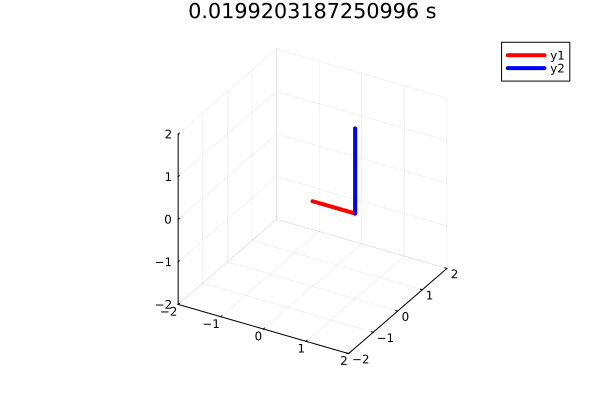

In [11]:
game = GI.init(GameSpec(),)

furuta = SimulatedFurutaPendulum()
dt = 0.02
tmax = 5.
tspan = 0.:dt:tmax
xs = zeros(length(tspan),4)
@show game.state
furuta.x = [0.,0.,0.,0.]
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    u = (1 - 2*(sin(10π*t)>0.))
    GI.play!(game,u)
    @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
# plot(tspan,xs)
animate_pendulum(xs[:,1],xs[:,3],tmax)


In [8]:
# AlphaZero.Scripts.test_game(GameSpec())

[ Info: There appears to be a unique initial state.


LoadError: MethodError: no method matching action_string(::GameSpec, ::Float64)
[0mClosest candidates are:
[0m  action_string([91m::AlphaZero.CommonRLInterfaceWrapper.Spec[39m, ::Any) at ~/.julia/environments/v1.8/dev/AlphaZero/src/common_rl_intf.jl:172
[0m  action_string([91m::AlphaZero.Examples.Tictactoe.GameSpec[39m, ::Any) at ~/.julia/environments/v1.8/dev/AlphaZero/games/tictactoe/game.jl:174
[0m  action_string([91m::AlphaZero.Examples.ConnectFour.GameSpec[39m, ::Any) at ~/.julia/environments/v1.8/dev/AlphaZero/games/connect-four/game.jl:263
[0m  ...

In [60]:
using Flux.Optimise
using Dates

Network = NetLib.SimpleNet

netparams = NetLib.SimpleNetHP(
  width=100,
  depth_common=2,
  use_batch_norm=false)

self_play = SelfPlayParams(
  sim=SimParams(
    num_games=64,
    num_workers=12,
    batch_size=12,
    use_gpu=false,
    reset_every=16,
    flip_probability=0.,
    alternate_colors=false),
  mcts=MctsParams(
    num_iters_per_turn=50,
    cpuct=1.0,
    temperature=ConstSchedule(0.),
    dirichlet_noise_ϵ=0.,
    dirichlet_noise_α=1.))

arena = ArenaParams(
  sim=SimParams(
    num_games=10,
    num_workers=10,
    batch_size=10,
    use_gpu=false,
    reset_every=1,
    flip_probability=0.,
    alternate_colors=true),
  mcts = self_play.mcts,
  update_threshold=-1e10)

learning = LearningParams(
  use_gpu=false,
  use_position_averaging=false,
  samples_weighing_policy=CONSTANT_WEIGHT,
  rewards_renormalization=10,
  l2_regularization=1e-4,
  # optimiser=Adam(lr=5e-3),
  optimiser=CyclicNesterov(lr_base=5e-3,lr_high=1e-2,lr_low=1e-3,momentum_low=0.5,momentum_high=0.9),
  batch_size=64,
  loss_computation_batch_size=2048,
  nonvalidity_penalty=1.,
  min_checkpoints_per_epoch=1,
  max_batches_per_checkpoint=5_000,
  num_checkpoints=1)

my_params = Params(
  arena=arena,
  self_play=self_play,
  learning=learning,
  num_iters=10,
  memory_analysis=nothing,
  ternary_outcome=false,
  # ternary_rewards=false,
  use_symmetries=false,
  mem_buffer_size=PLSchedule(100_000))

benchmark_sim = SimParams(
  arena.sim;
  num_games=10,
  num_workers=4,
  batch_size=4)

benchmark = [
  Benchmark.Single(
    Benchmark.Full(self_play.mcts),
    benchmark_sim),
  Benchmark.Single(
    Benchmark.NetworkOnly(),
    benchmark_sim)]

experiment = Experiment(
  "Pendulum-$(now())", GameSpec(), my_params, Network, netparams, benchmark)

Experiment("Pendulum-2023-05-23T18:37:39.025", GameSpec(0.02), Params(SelfPlayParams(MctsParams(1.0, 1.0, 50, ConstSchedule{Float64}(0.0), 0.0, 1.0, 1.0), SimParams(64, 12, 12, false, true, 16, 0.0, false)), nothing, LearningParams(false, false, CONSTANT_WEIGHT, CyclicNesterov(0.005f0, 0.01f0, 0.001f0, 0.5f0, 0.9f0), 0.0001f0, 10.0f0, 1.0f0, 64, 2048, 1, 5000, 1), ArenaParams(MctsParams(1.0, 1.0, 50, ConstSchedule{Float64}(0.0), 0.0, 1.0, 1.0), SimParams(10, 10, 10, false, true, 1, 0.0, true), -1.0e10), 10, false, false, PLSchedule{Int64}([0], [100000])), SimpleNet, SimpleNetHP(100, 2, 1, 1, false, 0.6f0), AlphaZero.Benchmark.Single[AlphaZero.Benchmark.Single(AlphaZero.Benchmark.Full(MctsParams(1.0, 1.0, 50, ConstSchedule{Float64}(0.0), 0.0, 1.0, 1.0)), SimParams(10, 4, 4, false, true, 1, 0.0, true)), AlphaZero.Benchmark.Single(AlphaZero.Benchmark.NetworkOnly(1.0), SimParams(10, 4, 4, false, true, 1, 0.0, true))])

In [41]:
Scripts.dummy_run(experiment)


Initializing a new AlphaZero environment

  Initial report
  
    Number of network parameters: 41,304
    Number of regularized network parameters: 40,800
    Memory footprint per MCTS node: 288 bytes
  
  Running benchmark: AlphaZero
  
    
    Average reward: -1319.62, redundancy: 0.0%
  
  Running benchmark: Network Only
  
    
    Average reward: -978.92, redundancy: 0.0%


┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen


Starting iteration 1

  Starting self-play
  
    
    Generating 874 samples per second on average
    Average exploration depth: 1.0
    MCTS memory footprint per worker: 144.58kB
    Experience buffer size: 251 (251 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      5896.955896.5918   0.3246   0.0417   0.0000   0.6904   1.0817
      5883.735883.4175   0.2779   0.0417   0.0000   0.6904   1.0675
    
    Launching a checkpoint evaluation
    
      
      Average reward: +0.00 (network replaced), redundancy: 0.0%
  
  Running benchmark: AlphaZero
  
    
    Average reward: -1319.62, redundancy: 0.0%
  
  Running benchmark: Network Only
  
    
    Average reward: -913.48, redundancy: 0.8%

Starting iteration 2

  Starting self-play
  


┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    
    Generating 2,367 samples per second on average
    Average exploration depth: 1.0
    MCTS memory footprint per worker: 144.58kB
    Experience buffer size: 502 (251 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      5883.735883.4180   0.2772   0.0417   0.0000   0.6904   1.0675
      5883.665883.4146   0.2082   0.0417   0.0000   0.6904   1.0309
    
    Launching a checkpoint evaluation
    
      
      Average reward: +0.00 (network replaced), redundancy: 0.0%
  
  Running benchmark: AlphaZero
  
    
    Average reward: -1319.62, redundancy: 0.0%
  
  Running benchmark: Network Only
  
    
    Average reward: -978.02, redundancy: 0.4%

Training completed



┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

In [42]:
Scripts.train(experiment)


Initializing a new AlphaZero environment

  Initial report
  
    Number of network parameters: 41,304
    Number of regularized network parameters: 40,800
    Memory footprint per MCTS node: 288 bytes
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:20
    
    Average reward: -516.69, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
    Average reward: -857.49, redundancy: 1.2%


┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen


Starting iteration 1

  Starting self-play
  
    Progress: 100%|█████████████████████████████████████| Time: 0:01:18    

    Generating 204 samples per second on average
    Average exploration depth: 4.8
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 16,064 (1,379 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      865.721 865.5847   0.0955   0.0416   0.0000   0.9995   1.0958
      861.072 861.0099   0.0204   0.0418   0.0000   0.9995   1.0173
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:23
      
      Average reward: +5.32 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21
    
    Average reward: -511.36, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|███████████████

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:21    

    Generating 198 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 32,128 (2,372 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      865.588 865.5260   0.0209   0.0418   0.0000   0.9976   1.0174
      865.588 865.5260   0.0204   0.0416   0.0000   0.9976   1.0156
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:23
      
      Average reward: +0.89 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21    Progress:  30%|███████████▏                         |  ETA: 0:00:17
    
    Average reward: -510.48, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progre

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:16    

    Generating 209 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.69MB
    Experience buffer size: 48,192 (3,122 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      862.298 862.2368   0.0203   0.0416   0.0000   0.9982   1.0156
      862.298 862.2368   0.0201   0.0413   0.0000   0.9982   1.0193
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:21      Progress:  10%|███▌                               |  ETA: 0:00:56
      
      Average reward: +0.00 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:22    Progress:  30%|███████████▏                         |  ETA: 0:00:18                                

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:19    

    Generating 201 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 64,256 (3,928 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      860.942 860.8811   0.0200   0.0413   0.0000   0.9986   1.0193
      860.941 860.8811   0.0200   0.0408   0.0000   0.9986   1.0230
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:21      Progress:  15%|█████▎                             |  ETA: 0:01:03
      
      Average reward: -5.41 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21
    
    Average reward: -515.89, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progre

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:21    

    Generating 197 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 80,320 (4,757 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      861.150 861.0894   0.0199   0.0408   0.0000   0.9991   1.0231
      861.149 861.0894   0.0199   0.0403   0.0000   0.9991   1.0146
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:22
      
      Average reward: +5.41 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:18
    
    Average reward: -510.48, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
    

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:22    

    Generating 194 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.69MB
    Experience buffer size: 96,384 (5,399 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      861.640 861.5803   0.0197   0.0403   0.0000   0.9995   1.0145
      861.639 861.5803   0.0195   0.0396   0.0000   0.9995   1.0206
    
    Launching a checkpoint evaluation
    
      Progress:  65%|██████████████████████▊            |  ETA: 0:00:12      
      Average reward: -5.41 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21
    
    Average reward: -515.89, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
    A

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:21    

    Generating 198 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 100,000 (5,694 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      865.742 865.6831   0.0200   0.0396   0.0000   0.9997   1.0205
      865.742 865.6831   0.0199   0.0389   0.0000   0.9997   1.0218
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:21
      
      Average reward: +0.00 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21
    
    Average reward: -515.89, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
   

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:23    

    Generating 193 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 100,000 (5,344 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      867.195 867.1372   0.0197   0.0389   0.0000   1.0013   1.0219
      867.195 867.1372   0.0197   0.0383   0.0000   1.0013   1.0231
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:20
      
      Average reward: +0.00 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21
    
    Average reward: -515.89, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
   

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:23    

    Generating 193 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.68MB
    Experience buffer size: 100,000 (5,203 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      868.862 868.8049   0.0194   0.0383   0.0000   1.0021   1.0231
      868.861 868.8049   0.0194   0.0376   0.0000   1.0021   1.0199
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:22
      
      Average reward: +5.41 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:20
    
    Average reward: -510.48, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
   

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    Progress: 100%|█████████████████████████████████████| Time: 0:01:19    

    Generating 202 samples per second on average
    Average exploration depth: 4.7
    MCTS memory footprint per worker: 21.69MB
    Experience buffer size: 100,000 (5,069 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      868.874 868.8179   0.0192   0.0376   0.0000   1.0020   1.0198
      868.874 868.8179   0.0191   0.0370   0.0000   1.0020   1.0219
    
    Launching a checkpoint evaluation
    
      Progress: 100%|███████████████████████████████████| Time: 0:00:20
      
      Average reward: +0.00 (network replaced), redundancy: 90.4%
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:21    Progress:  30%|███████████▏                         |  ETA: 0:00:17
    
    Average reward: -510.48, redundancy: 90.4%
  
  Running benchmark: Network Only
  
    Progr

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

In [46]:
s = Session(experiment)
AZplayer = AlphaZeroPlayer(s)
Netplayer = NetworkPlayer(s.env.bestnn);


Loading environment from: sessions/Pendulum-2023-05-23T17:47:44.967



MctsPlayer{AlphaZero.MCTS.Env{Vector{Float64}, SimpleNet}}(AlphaZero.MCTS.Env{Vector{Float64}, SimpleNet}(Dict{Vector{Float64}, AlphaZero.MCTS.StateInfo}(), SimpleNet(GameSpec(0.02), SimpleNetHP(100, 2, 1, 1, false, 0.6f0), Chain(flatten, Dense(4, 100, relu), Dense(100, 100, relu), Dense(100, 100, relu)), Chain(Dense(100, 100, relu), Dense(100, 1, tanh)), Chain(Dense(100, 100, relu), Dense(100, 3), softmax)), 1.0, 1.0, 0.0, 1.0, 1.0, 0, 0, GameSpec(0.02)), 5, nothing, ConstSchedule{Float64}(0.0))

In [36]:

# 1 iteration
s = Session(experiment,dir="sessions/Pendulum-2023-05-17T13:32:40.123")
AZplayer = AlphaZeroPlayer(s)
Netplayer = NetworkPlayer(s.env.bestnn)


Loading environment from: sessions/Pendulum-2023-05-17T13:32:40.123



[ Info: Using modified parameters


NetworkPlayer{SimpleNet}(SimpleNet(GameSpec(0.02), SimpleNetHP(100, 2, 1, 1, false, 0.6f0), Chain(flatten, Dense(4, 100, relu), Dense(100, 100, relu), Dense(100, 100, relu)), Chain(Dense(100, 100, relu), Dense(100, 1, tanh)), Chain(Dense(100, 100, relu), Dense(100, 3), softmax)))

In [61]:
# 5 iterations
s = Session(experiment,dir="sessions/Pendulum-2023-05-17")
AZplayer = AlphaZeroPlayer(s)
Netplayer = NetworkPlayer(s.env.bestnn)


Loading environment from: sessions/Pendulum-2023-05-17T15:38:32.121



[ Info: Using modified parameters


NetworkPlayer{SimpleNet}(SimpleNet(GameSpec(0.02), SimpleNetHP(100, 2, 1, 1, false, 0.6f0), Chain(flatten, Dense(4, 100, relu), Dense(100, 100, relu), Dense(100, 100, relu)), Chain(Dense(100, 100, relu), Dense(100, 1, tanh)), Chain(Dense(100, 100, relu), Dense(100, 3), softmax)))

# AlphaZero balancing a pendulum

(but it takes forever (~1sec) to make a decision, so it's not really useful)

Also the simulation is unrealistic: We are using the simulated DISCRETE environment. This means that at each time step, the simulated state (for example theta = 0.18283) is replaced by the closest discretization bin (e.g. theta = 0.2). 

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
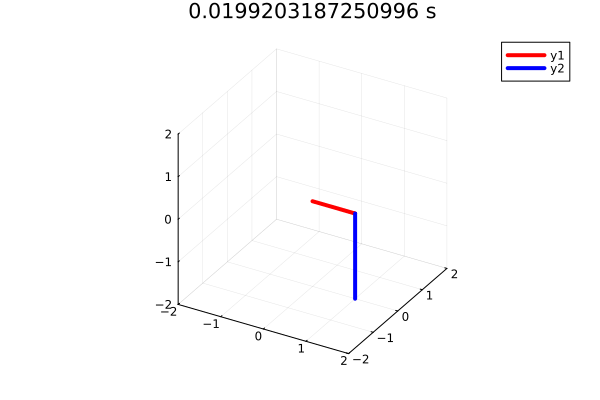

In [16]:
animate_pendulum(xs[:,1],xs[:,3],tmax)

# AZ in a continuous env (no bin centering)

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
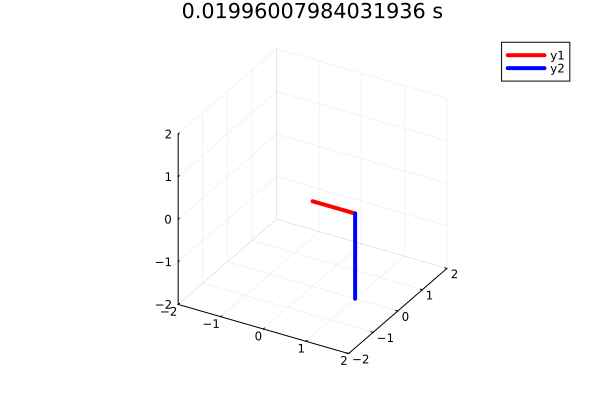

In [71]:
dt = 0.02
game = GI.init(GameSpec(dt),)

furuta = SimulatedFurutaPendulum()
tmax = 10.
tspan = 0.:dt:tmax
furuta.x = [0,0,pi,0]
xs = zeros(length(tspan),4)
@show game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    game.state = discrete_state(furuta.x)
    state_copy = game.state[:]
    u = select_move(AZplayer,game,1)
    # u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    game.t = 0. # allow more than 5 sec.
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    # furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
animate_pendulum(xs[:,1],xs[:,3],tmax)# plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
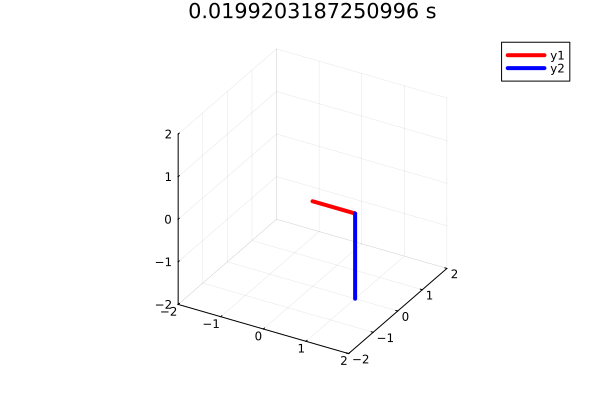

In [37]:
animate_pendulum(xs[:,1],xs[:,3],tmax)

# Real time AZ in continous env

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
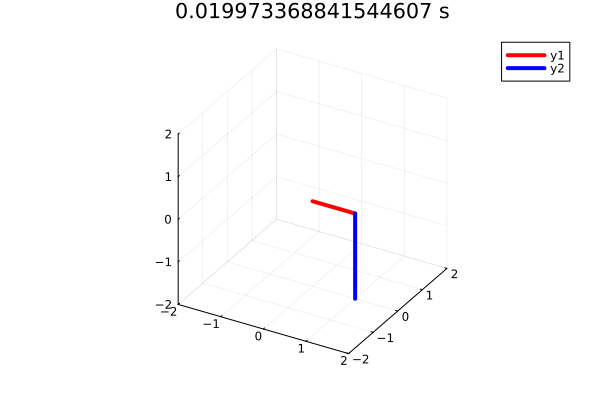

In [70]:
# LightAZplayer = MctsPlayer(
#     GameSpec(),
#     s.env.bestnn,
#     MctsParams(
#         num_iters_per_turn=50,
#         cpuct=1.0,
#         temperature=ConstSchedule(0.),
#         dirichlet_noise_ϵ=0.,
#         dirichlet_noise_α=1.))
LightAZplayer = AlphaZeroPlayer(s,timeout=0.02)
dt = 0.02
game = GI.init(GameSpec(dt),)

furuta = SimulatedFurutaPendulum()
tmax = 15.
tspan = 0.:dt:tmax
furuta.x = [0,0,pi,0]
xs = zeros(length(tspan),4)
@show game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    game.state = discrete_state(furuta.x)
    state_copy = game.state[:]
    # u = select_move(AZplayer,game,1)
    u = select_move(LightAZplayer,game,1)
    # u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    game.t = 0. # allow more than 5 sec.
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    # furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
# plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])
animate_pendulum(xs[:,1],xs[:,3],tmax)

# Same but using network only (no MCTS)

This is not very good, the model eventually swings up but fails to balance

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
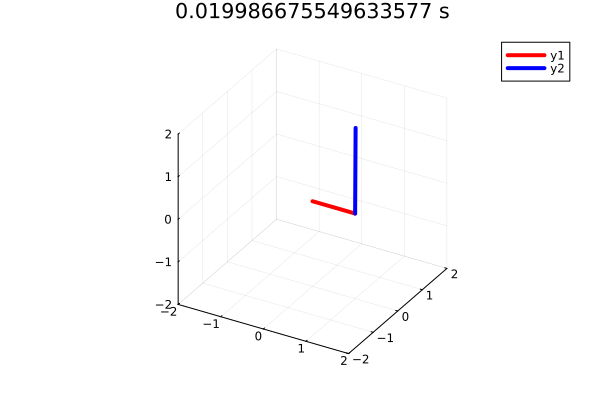

In [23]:
include("sim/env.jl")
game = GI.init(GameSpec(),)

furuta = SimulatedFurutaPendulum()
dt = 0.02
tmax = 30.
tspan = 0.:dt:tmax
furuta.x = [0,0,0.01,0]
xs = zeros(length(tspan),4)
@show game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    state_copy = game.state[:]
    # u = select_move(AZplayer,game,1)
    u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    game.t = 0. # allow more than 5 sec.
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])
animate_pendulum(xs[:,1],xs[:,3],tmax)



Same policy network but in the CONTINUOUS simulation (no bin centering at each time step)

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
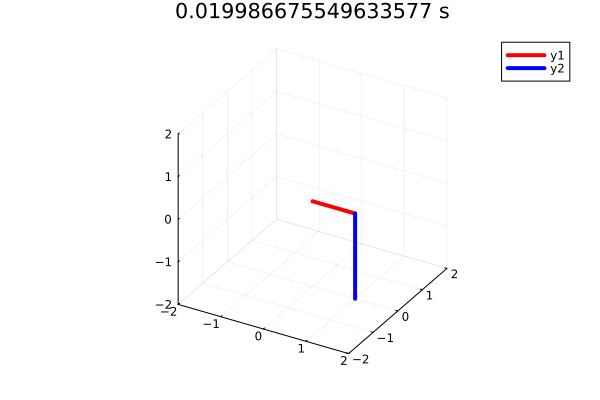

In [32]:
include("sim/env.jl")
game = GI.init(GameSpec(),)

furuta = SimulatedFurutaPendulum()
dt = 0.02
tmax = 30.
tspan = 0.:dt:tmax
xs = zeros(length(tspan),4)
@show game.state
furuta.x = game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    state_copy = game.state[:]
    # u = select_move(AZplayer,game,1)
    u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    game.t = 0. # allow more than 5 sec.
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    # furuta.x[2:4] = discrete_state(furuta.x)[2:4] # No centering
end
# plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])
animate_pendulum(xs[:,1],xs[:,3],tmax)



# Results Summary

Here is a commentary on the first results of the AlphaZero training:

The algorithm takes a lot of time to train (~30mins for 64 episodes)

Some big differences between using it for a board game and using it for a pendulum:
* One player only
    * This is handled natively by the library
    
* No terminal state
    * Instead, I set a time limit of t=5s. but it is not handled perfectly. I'm still not sure of what it is doing exactly.
    
* Reward every step instead of at the end of a game
    * Also handled natively
    
* Need to get really quick response time.
    * If I use the MC Tree Search, the algorithm takes 0.5s to compute a single timestep iteration. This is not possible for our case so I ended up relying on the policy network alone (which is much quicker).

